# **Dog Breed Identification** *using Deep Learning*

## Problem Description:
 * Who's a good dog? Who likes ear scratches? Well, it seems those fancy deep neural networks don't have all the answers. However, maybe they can answer that ubiquitous question we all ask when meeting a four-legged stranger: what kind of good pup is that?

* With 120 breeds of dogs and a limited number training images per class, you might find the problem more, err, ruff than you anticipated.

## Data:
 *  A training set and a test set of images of dogs. Each image has a filename that is its unique id. The dataset comprises 120 breeds of dogs. The goal of the project is to create a classifier capable of determining a dog's breed from a photo.

*Dataset from Kaggle: https://www.kaggle.com/c/dog-breed-identification/data*

## Evaluation:
  * This project is evaluated on Multi Class Log Loss between the predicted probability and the observed target.

## Model:
  * Model from Tensorflow Hub. 

  * Model URL: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
  * About Model: This TF-Hub module uses the TF-Slim implementation of mobilenet_v2 with a depth multiplier of 1.0 and an input size of 224x224 pixels.

  The module contains a trained instance of the network, packaged to do the image classification that the network was trained on. If you merely want to transform images into feature vectors, use module google/tf2-preview/mobilenet_v2/feature_vector/4 instead, and save the space occupied by the classification layer.



In [1]:
# lets import Tensorflow
import tensorflow as tf
import tensorflow_hub as hub

tf.__version__

'2.8.0'

In [2]:
# check whether GPU is there are not
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
import pandas as pd

# Getting our Labels data
labels_csv = pd.read_csv("/content/drive/MyDrive/ML_DATA/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
# Viewing how many images are there in Each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

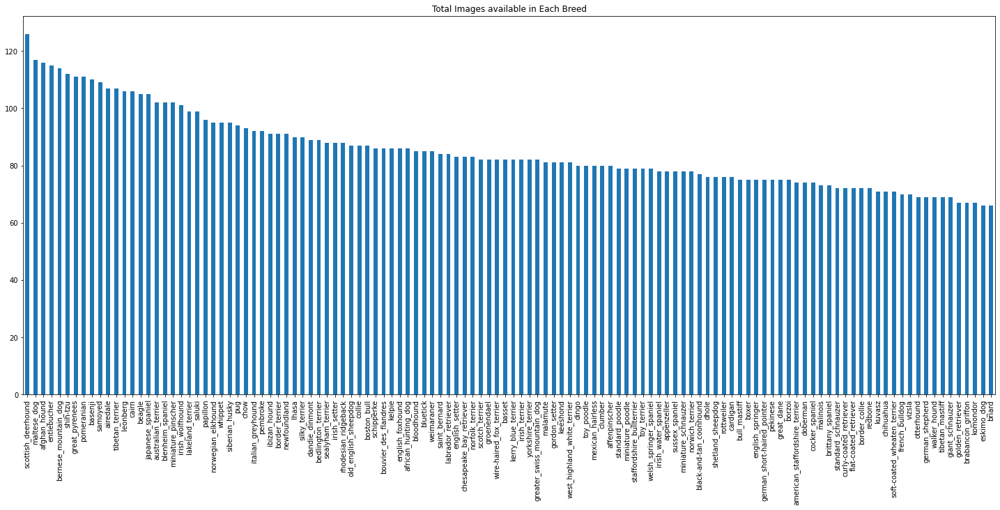

In [5]:
import matplotlib.pyplot as plt

# Visualizing the total images available in each breed
labels_csv["breed"].value_counts().plot(kind="bar", figsize=(25, 10))

plt.title("Total Images available in Each Breed");

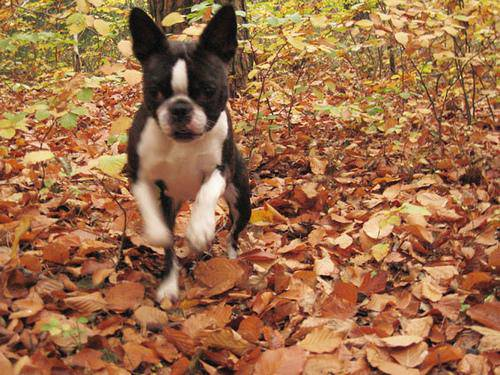

In [6]:
# viewing an image
from IPython.display import Image
Image("/content/drive/MyDrive/ML_DATA/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [7]:
# creating pathnames from IDs in label_csv

filenames = ["/content/drive/MyDrive/ML_DATA/train/" + id + ".jpg" for id in labels_csv["id"]]

filenames[:5]

['/content/drive/MyDrive/ML_DATA/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ML_DATA/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ML_DATA/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ML_DATA/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ML_DATA/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

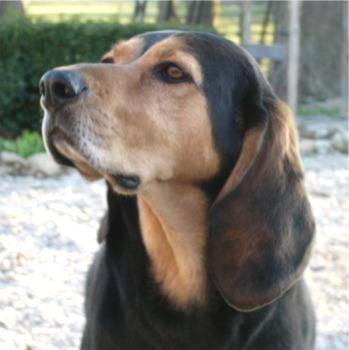

In [8]:
Image(filenames[2001]) 

In [9]:
# preparing labels

labels = labels_csv["breed"].to_numpy()
print(labels)
print(len(labels))

['boston_bull' 'dingo' 'pekinese' ... 'airedale' 'miniature_pinscher'
 'chesapeake_bay_retriever']
10222


In [10]:
# finding unique breeds
import numpy as np

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [11]:
# turning labels into boolean array
bool_labels = [label == unique_breeds for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [12]:
# Setup x and y variables
x = filenames
y = bool_labels

In [13]:
# set no. of images to use for experimenting

NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [14]:
# Splitting our data into training and validating set
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[ : NUM_IMAGES ], y[ : NUM_IMAGES], test_size=0.2, random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

# creating a function to preprocess our images

* Read the image using tensorflow.
* Convert the image into numerical array using tensorflow
* Normalise the Image ( Convert the 3 channel image from 0-255 to 0-1 )
* Resize the Image.

In [15]:
IMAGE_SIZE = 224

def preprocess_image(path, size=IMAGE_SIZE):
  image = tf.io.read_file(path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[size, size])
  return image

In [16]:
# creating a function to return a tuple of processed image and label

def get_image_and_label(path, label):
  return preprocess_image(path, IMAGE_SIZE), label

In [17]:
# testing above two functions
get_image_and_label(x[1], y[1])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.22176053, 0.1532646 , 0.12077089],
         [0.24290617, 0.17007563, 0.12532842],
         [0.25025794, 0.16272292, 0.10750583],
         ...,
         [0.4866906 , 0.31810698, 0.18481737],
         [0.46775866, 0.32910115, 0.20204483],
         [0.36027768, 0.2283099 , 0.11981372]],
 
        [[0.22331059, 0.14479166, 0.10454448],
         [0.20956516, 0.13433544, 0.08120592],
         [0.20576334, 0.11818807, 0.06297097],
         ...,
         [0.34747207, 0.21052358, 0.10098223],
         [0.25428382, 0.14531395, 0.05989731],
         [0.22268865, 0.11715643, 0.03506609]],
 
        [[0.21673436, 0.12777252, 0.0741048 ],
         [0.20701681, 0.11805496, 0.05878148],
         [0.22288738, 0.12433178, 0.0666433 ],
         ...,
         [0.19956292, 0.10319562, 0.05528758],
         [0.24323113, 0.17113218, 0.12510629],
         [0.17322923, 0.11525137, 0.08183777]],
 
        ...,
 
        [[0.71888185, 0.40606675

In [18]:
BATCH_SIZE = 32

# creating a function to convert our data into batches(preferred 32).
# refer tensorflow image preprocessing documentation for more idea
# https://www.tensorflow.org/tutorials/load_data/images

def create_data_batches(x, y=None, size=BATCH_SIZE, validation_set=False, test_set=False):
  if test_set:
    print("creating testing batch...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batches = data.map(preprocess_image).batch(size)
    return data_batches

  elif validation_set:
    print("creating validation batch...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batches = data.map(get_image_and_label).batch(size)
    return data_batches

  else:
    print("creating training batch....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))

    data = data.shuffle(buffer_size=len(x))

    data = data.map(get_image_and_label)

    data_batches = data.batch(size)
  return data_batches
  

In [19]:
# create training and valid data
train_data = create_data_batches(x_train, y_train)
valid_data = create_data_batches(x_val, y_val, validation_set=True)

creating training batch....
creating validation batch...


In [20]:
print(train_data)
print(valid_data)

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>
<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>


In [21]:
# creating a function to visualize the databatch

def show_25_image(images, labels):
  plt.figure(figsize=(20,15))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [22]:
# to visualize the image, we need to unbatch the data that we have batched

train_images, train_labels = next(train_data.as_numpy_iterator())

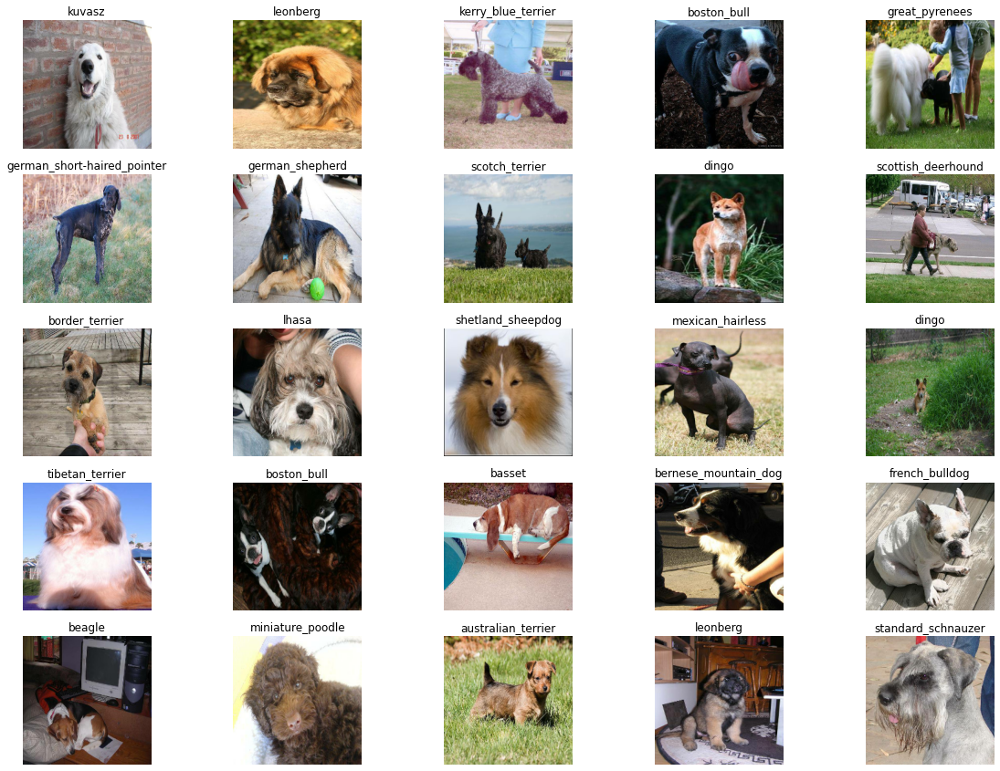

In [23]:
show_25_image(train_images, train_labels)

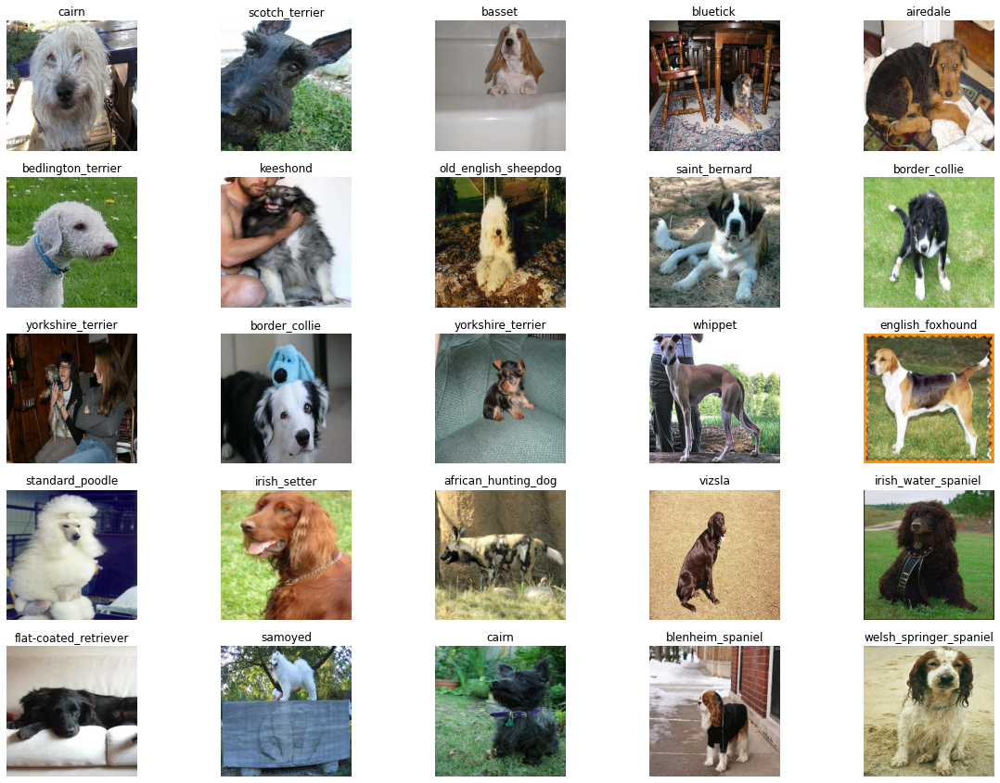

In [24]:
# visualizing valid data set
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_image(valid_images, valid_labels)

# Building a Model

In [25]:
# shape of our image
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URl = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [26]:
# create a function which builds keras model

def create_model(INPUT_SHAPE=INPUT_SHAPE, OUTPUT_SHAPE=OUTPUT_SHAPE, MODEL_URl=MODEL_URl):
  # setup model
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URl),
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])
  # compile model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  # build the model
  model.build(INPUT_SHAPE)
  return model

In [27]:
model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URl)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3,660,505
Trainable params: 120,240
Non-trainable params: 3,540,265
_________________________________________________________________


In [28]:
# creating a helper functions

# creating tensorboard to visualize our model progress while training

import datetime
import os
%load_ext tensorboard

def create_tensorBoard():
  logDir = os.path.join("/content/drive/MyDrive/ML_DATA/logs",
                        datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S'))
  return tf.keras.callbacks.TensorBoard(logDir)


In [29]:
# creating early stopping - stops the model training if the accuracy starts decreasing or loss increases.

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy" ,patience=3)

# **Training a Model**

In [30]:
NUM_OF_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [31]:
# creating a function to create & train a model

def train_model():

  # creating a model 
  model = create_model()

  # calling tensorboard
  tensorboard = create_tensorBoard();

  # fitting the model
  model.fit(
      x=train_data,
      epochs=NUM_OF_EPOCHS,
      validation_data=valid_data,
      validation_freq=1,
      callbacks=[tensorboard, early_stopping]
  )

  return model

In [32]:
# fit the model

model = train_model()

Epoch 1/100
25/25 [==============================] - 95s 3s/step - loss: 4.5491 - accuracy: 0.1037 - val_loss: 3.3503 - val_accuracy: 0.3400
Epoch 2/100
25/25 [==============================] - 4s 169ms/step - loss: 1.5016 - accuracy: 0.7225 - val_loss: 2.1263 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 4s 174ms/step - loss: 0.4923 - accuracy: 0.9438 - val_loss: 1.6729 - val_accuracy: 0.6500
Epoch 4/100
25/25 [==============================] - 4s 176ms/step - loss: 0.2179 - accuracy: 0.9912 - val_loss: 1.5065 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 5s 188ms/step - loss: 0.1290 - accuracy: 0.9987 - val_loss: 1.4522 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.0901 - accuracy: 0.9987 - val_loss: 1.4076 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================] - 4s 171ms/step - loss: 0.0675 - accuracy: 1.0000 - val_loss: 1.3827 - val_accuracy: 0.6750
E

In [33]:
# visualize tensorbiard
%tensorboard --logdir /content/drive/MyDrive/ML_DATA/logs

<IPython.core.display.Javascript object>

In [34]:
# make predictions on validation data

predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 2s 143ms/step


array([[1.3752552e-03, 6.9066989e-03, 7.1038783e-05, ..., 3.9744246e-04,
        2.4243986e-04, 6.7787026e-03],
       [1.9301358e-04, 2.3047503e-03, 3.3913434e-03, ..., 7.8608471e-05,
        1.2035420e-02, 1.2918801e-05],
       [2.4846964e-05, 1.2238914e-04, 5.4989410e-05, ..., 4.6768197e-04,
        3.9352490e-05, 2.0481239e-03],
       ...,
       [2.0897252e-05, 2.9860824e-04, 1.0047717e-05, ..., 1.4242699e-05,
        3.6461406e-05, 1.4102209e-04],
       [6.7706034e-04, 3.0805215e-05, 2.4029250e-05, ..., 3.9075552e-05,
        1.2688219e-04, 1.2842915e-03],
       [2.0271364e-04, 2.1940081e-05, 3.3519937e-05, ..., 4.1066115e-03,
        1.9757243e-04, 1.2481897e-03]], dtype=float32)

In [35]:
# creating a function to turn prediction to label

def get_prediction_label(pred):
  return unique_breeds[np.argmax(pred)]


In [36]:
get_prediction_label(predictions[0])

'border_terrier'

In [37]:
# creating a function to unbatch the dataset 

def unbatch_data(data):

  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [38]:
val_images, val_labels = unbatch_data(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [39]:
# creating a function to visualize the predicted label with the truth label

def plot_pred(predictions_prob, labels, images, n=1):
  pred_prob, image, true_lab = predictions_prob[n], images[n], labels[n]

  pred_label = get_prediction_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  print("Predicted Label: " + str(pred_label));
  print("Truth Label: " + str(true_lab));
  print("Max Probability: {:.2f}%".format(np.max(pred_prob) * 100));


Predicted Label: scotch_terrier
Truth Label: scotch_terrier
Max Probability: 80.48%


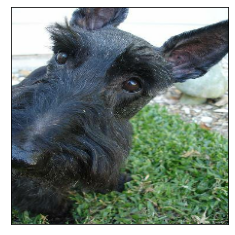

In [47]:
plot_pred(predictions, val_labels, val_images, 1)

In [48]:
# creating a function to load and save model

def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/ML_DATA/models", datetime.datetime.now().strftime("%y%m%d - %h%m%s"))
  
  modelpath = modeldir + '-' + suffix + '.hs'
  model.save(modelpath)
  return modelpath

def load_model(modelpath):
  model = tf.keras.models.load_model(modelpath, custom_objects={
      "KerasLayer": hub.KerasLayer
  })
  return model

In [49]:
//saving a model
save_model(model, "1000-images-mobilenetv2-adam")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/ML_DATA/models/220227 - Feb021645974895-1000-images-mobilenetv2-adam.hs/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/ML_DATA/models/220227 - Feb021645974895-1000-images-mobilenetv2-adam.hs/assets


'/content/drive/MyDrive/ML_DATA/models/220227 - Feb021645974895-1000-images-mobilenetv2-adam.hs'

In [52]:
# loading a model
loaded_1000_image_model = load_model("/content/drive/MyDrive/ML_DATA/models/220227 - Feb021645974895-1000-images-mobilenetv2-adam.hs")

In [53]:
# training model with full dataset

full_data = create_data_batches(x, y)

creating training batch....


In [54]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
len(full_data)

320

In [56]:
# creaating a model
full_model = create_model()

In [57]:
full_model_tensorboard = create_tensorBoard()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [58]:
# training a model with full data
full_model.fit(x=full_data, epochs=NUM_OF_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 801s 2s/step - loss: 1.2933 - accuracy: 0.6767
Epoch 2/100
320/320 [==============================] - 48s 150ms/step - loss: 0.3728 - accuracy: 0.8891
Epoch 3/100
320/320 [==============================] - 47s 147ms/step - loss: 0.2198 - accuracy: 0.9395
Epoch 4/100
320/320 [==============================] - 46s 144ms/step - loss: 0.1384 - accuracy: 0.9676
Epoch 5/100
320/320 [==============================] - 61s 189ms/step - loss: 0.0955 - accuracy: 0.9811
Epoch 6/100
320/320 [==============================] - 73s 229ms/step - loss: 0.0693 - accuracy: 0.9886
Epoch 7/100
320/320 [==============================] - 73s 229ms/step - loss: 0.0533 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0410 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 82s 257ms/step - loss: 0.0328 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 52s 163ms/

In [59]:
# saving the fully trained model
save_model(full_model, "full_image-mobilenetv2-adam")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/ML_DATA/models/220227 - Feb021645978227-full_image-mobilenetv2-adam.hs/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/ML_DATA/models/220227 - Feb021645978227-full_image-mobilenetv2-adam.hs/assets


'/content/drive/MyDrive/ML_DATA/models/220227 - Feb021645978227-full_image-mobilenetv2-adam.hs'

In [60]:
# loading the fully trained model

loaded_full_model = load_model("/content/drive/MyDrive/ML_DATA/models/220227 - Feb021645978227-full_image-mobilenetv2-adam.hs")

In [67]:
# testing our model with test data

test_path = "/content/drive/MyDrive/ML_DATA/test/"

# loading all images path names
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[0]


'/content/drive/MyDrive/ML_DATA/test/e732916519751eaa0cb2ba0cc1217ab9.jpg'

In [68]:
# creating dataset of the images
test_data = create_data_batches(test_filenames, test_set=True)

creating testing batch...


In [69]:
# making predictions with test data

test_prediction = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 166s 505ms/step


In [72]:
# saving test prediction in csv

np.savetxt("/content/drive/MyDrive/ML_DATA/test_preds.csv",test_prediction, delimiter=",")

In [73]:
# load test prediction in csv

loaded_test_preds = np.loadtxt("/content/drive/MyDrive/ML_DATA/test_preds.csv", delimiter=",")

In [74]:
loaded_test_preds

array([[2.04208747e-10, 9.70412994e-09, 5.45122214e-09, ...,
        2.11255475e-11, 1.03338442e-10, 1.20980048e-09],
       [8.70618161e-11, 1.10466754e-10, 1.60141261e-10, ...,
        1.55952768e-11, 5.01054406e-12, 7.44276128e-14],
       [1.36842551e-10, 2.32705133e-06, 5.28029342e-10, ...,
        1.72347472e-06, 4.60600525e-01, 1.05805526e-07],
       ...,
       [2.81159427e-12, 5.45327057e-05, 2.03312089e-10, ...,
        6.80588874e-09, 4.41488668e-09, 1.87805185e-08],
       [1.01113047e-08, 3.54255714e-09, 4.72784167e-09, ...,
        2.54669867e-08, 7.15577952e-09, 8.58972093e-09],
       [3.25611160e-09, 4.56208945e-04, 3.67795905e-09, ...,
        2.94419328e-06, 1.40741021e-11, 4.50899324e-06]])

# To make Prediction on custom Images:
* Import the images and store them in a folder.
* Load all the image paths and store them in a array.
* Pass the file paths array to create_data_batches() function.
* Pass the data from the function to predict function.
* Compare predicted label with custom label

In [82]:
custom_image_path = "/content/drive/MyDrive/ML_DATA/custom_images/"

# creating array of custom images file path
cus_img_file_paths = [custom_image_path + fname for fname in os.listdir(custom_image_path)]

# creating true label
cus_img_true_label = [fname.split('.')[0] for fname in os.listdir(custom_image_path)]

cus_img_true_label

['afghan_hound', 'rottweiler', 'doberman']

In [83]:
# creating a dataset
cus_img_dataset = create_data_batches(cus_img_file_paths, test_set=True)

creating testing batch...


In [84]:
cus_preds = loaded_full_model.predict(cus_img_dataset, verbose=1)

1/1 [==============================] - 1s 650ms/step


In [91]:
cus_preds[0]

array([5.13449006e-10, 9.97454345e-01, 3.02681835e-09, 4.95092323e-08,
       3.44067175e-09, 2.64730904e-09, 1.10263949e-08, 8.46550918e-09,
       1.18278125e-08, 6.71340716e-09, 2.96287539e-07, 2.03440166e-07,
       5.90053560e-07, 2.66222244e-08, 2.47559524e-06, 6.16636475e-09,
       1.19510669e-11, 8.10552903e-10, 1.57819193e-06, 1.16718663e-10,
       1.37258737e-11, 1.33374728e-10, 7.08099274e-11, 1.66624424e-03,
       3.44392994e-08, 2.88466913e-06, 3.52804932e-08, 1.70183034e-09,
       1.22481314e-08, 2.67138062e-10, 6.55136223e-10, 3.29754641e-07,
       7.71223540e-07, 3.46129724e-07, 1.79493629e-08, 6.79703627e-10,
       2.03936779e-08, 3.06029762e-08, 2.67929252e-08, 8.83144793e-08,
       2.04648040e-05, 1.66767944e-09, 3.96672073e-09, 2.55398255e-11,
       2.19443500e-05, 6.70703597e-12, 1.24649064e-08, 1.06313198e-08,
       2.60243411e-07, 3.00231157e-04, 2.33518658e-05, 1.00389428e-07,
       2.85725264e-07, 2.44502751e-10, 1.16539660e-07, 1.10507925e-09,
      

In [97]:
cust_pred_label = [get_prediction_label(cus_preds[i]) for i in range(len(cus_preds))]

In [98]:
print(cus_img_true_label)
print(cust_pred_label)

['afghan_hound', 'rottweiler', 'doberman']
['afghan_hound', 'rottweiler', 'doberman']


In [100]:
cus_images = []

for images in cus_img_dataset.unbatch().as_numpy_iterator():
  cus_images.append(images)

Predicted Label: afghan_hound
Truth Label: afghan_hound
Max Probability: 99.75%


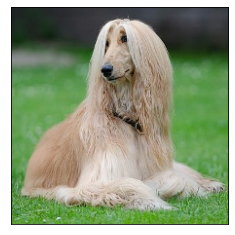

In [103]:
 plot_pred(cus_preds, cus_img_true_label, cus_images, 0)

Predicted Label: rottweiler
Truth Label: rottweiler
Max Probability: 96.25%


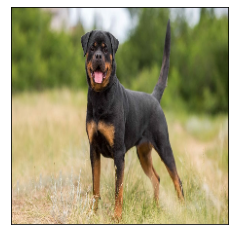

In [102]:
plot_pred(cus_preds, cus_img_true_label, cus_images, 1)

Predicted Label: doberman
Truth Label: doberman
Max Probability: 99.97%


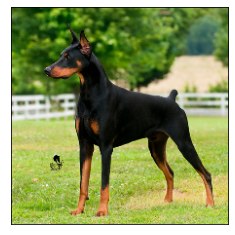

In [104]:
plot_pred(cus_preds, cus_img_true_label, cus_images, 2)